In [1]:
!unzip "/content/ipl-2020-player-performance.zip" -d "/content/dataset"

Archive:  /content/ipl-2020-player-performance.zip
  inflating: /content/dataset/IPL 2020 Squads.csv  
  inflating: /content/dataset/Matches IPL 2008-2019.csv  
  inflating: /content/dataset/Matches IPL 2020.csv  
  inflating: /content/dataset/Training.csv  
  inflating: /content/dataset/sample_submission.csv  


In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
train = pd.read_csv('/content/dataset/Training.csv')
match2020 = pd.read_csv('/content/dataset/Matches IPL 2020.csv')
prev_match = pd.read_csv('/content/dataset/Matches IPL 2008-2019.csv')
players = pd.read_csv('/content/dataset/sample_submission.csv', encoding='windows=1254')

In [4]:
match2020.head()


,match_id,city,date,team1,team2,venue,umpire1,umpire2,umpire3
0,1216492,Abu Dhabi,9/19/2020,MI,CSK,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Virender Sharma,Sundaram Ravi
1,1216493,Dubai (DSC),9/20/2020,DC,KXIP,Dubai International Cricket Stadium,Anil Chaudhary,Nitin Menon,Paul Reiffel
2,1216534,Dubai (DSC),9/21/2020,SRH,RCB,Dubai International Cricket Stadium,Anil Dandekar,Nitin Menon,Anil Chaudhary
3,1216496,Sharjah,9/22/2020,RR,CSK,Sharjah Cricket Stadium,Chettithody Shamshuddin,Vineet Kulkarni,KN Ananthapadmanabhan
4,1216508,Abu Dhabi,9/23/2020,KKR,MI,"Sheikh Zayed Stadium, Abu Dhabi",Chris Gaffaney,Sundaram Ravi,Virender Sharma


## Data Preprocessing

In [5]:
match2020.isnull().sum()


match_id    0
city        0
date        0
team1       0
team2       0
venue       0
umpire1     0
umpire2     0
umpire3     0
dtype: int64

In [6]:
prev_match.isnull().sum()

match_id             0
season               0
city                 7
date                 0
team1                0
team2                0
toss_winner          0
toss_decision        0
result               0
dl_applied           0
winner               4
win_by_runs          0
win_by_wickets       0
player_of_match      4
venue                0
umpire1              2
umpire2              2
umpire3            637
dtype: int64

In [7]:
prev_match.dropna(inplace=True)

In [8]:
train.head()

,Id,Runs,Boundaries,Six,Fifty,Hundred,Duck,Batting_Points,Wickets,4W_Haul,5W_Haul,Maidens,Bowling_Points,Total Points
0,1_Bipul Sharma,0,0,0,0,0,0,0,1,0,0,0,25,25
1,1_DJ Hooda,16,1,1,0,0,0,19,1,0,0,0,25,44
2,1_KM Jadhav,31,5,1,0,0,0,38,0,0,0,0,0,38
3,1_Mandeep Singh,24,5,0,0,0,0,29,0,0,0,0,0,29
4,1_Yuvraj Singh,62,10,3,1,0,0,86,0,0,0,0,0,86


In [9]:
train.isnull().sum()

Id                0
Runs              0
Boundaries        0
Six               0
Fifty             0
Hundred           0
Duck              0
Batting_Points    0
Wickets           0
4W_Haul           0
5W_Haul           0
Maidens           0
Bowling_Points    0
Total Points      0
dtype: int64

In [10]:
prev_match.head()

,match_id,season,city,date,team1,team2,toss_winner,toss_decision,result,dl_applied,winner,win_by_runs,win_by_wickets,player_of_match,venue,umpire1,umpire2,umpire3
636,7894,2018,Mumbai,7/4/2018,Mumbai Indians,Chennai Super Kings,Chennai Super Kings,field,normal,0,Chennai Super Kings,0,1,DJ Bravo,Wankhede Stadium,Chris Gaffaney,A Nanda Kishore,Anil Chaudhary
637,7895,2018,Mohali,8/4/2018,Delhi Daredevils,Kings XI Punjab,Kings XI Punjab,field,normal,0,Kings XI Punjab,0,6,KL Rahul,"Punjab Cricket Association IS Bindra Stadium, ...",Rod Tucker,K Ananthapadmanabhan,Nitin Menon
638,7896,2018,Kolkata,8/4/2018,Royal Challengers Bangalore,Kolkata Knight Riders,Kolkata Knight Riders,field,normal,0,Kolkata Knight Riders,0,4,SP Narine,Eden Gardens,C Shamshuddin,A.D Deshmukh,S Ravi
639,7897,2018,Hyderabad,9/4/2018,Rajasthan Royals,Sunrisers Hyderabad,Sunrisers Hyderabad,field,normal,0,Sunrisers Hyderabad,0,9,S Dhawan,"Rajiv Gandhi International Stadium, Uppal",Nigel Llong,Vineet Kulkarni,O Nandan
640,7898,2018,Chennai,10/4/2018,Kolkata Knight Riders,Chennai Super Kings,Chennai Super Kings,field,normal,0,Chennai Super Kings,0,5,SW Billings,"MA Chidambaram Stadium, Chepauk",Anil Chaudhary,Chris Gaffaney,A Nanda Kishore


## Exploratory Data Analysis

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


<Figure size 864x432 with 0 Axes>

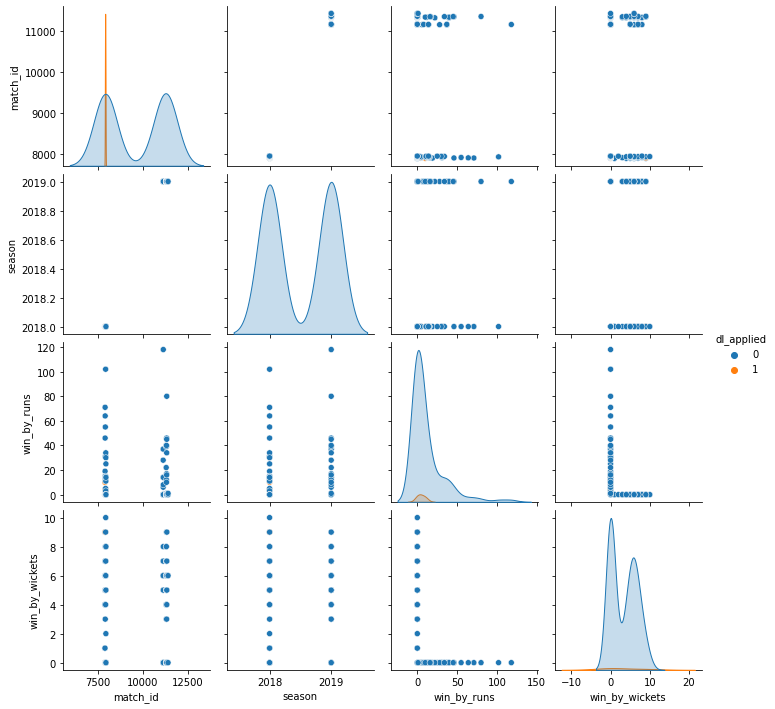

In [11]:
plt.figure(figsize=(12,6))
sns.pairplot(prev_match, hue='dl_applied')

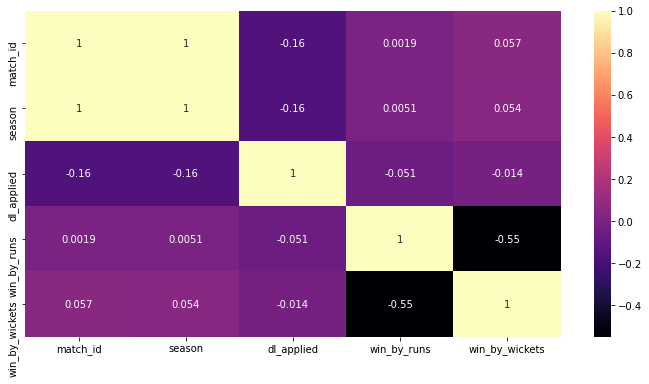

In [12]:
plt.figure(figsize=(12, 6))
sns.heatmap(prev_match.corr(), annot=True, cmap='magma')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


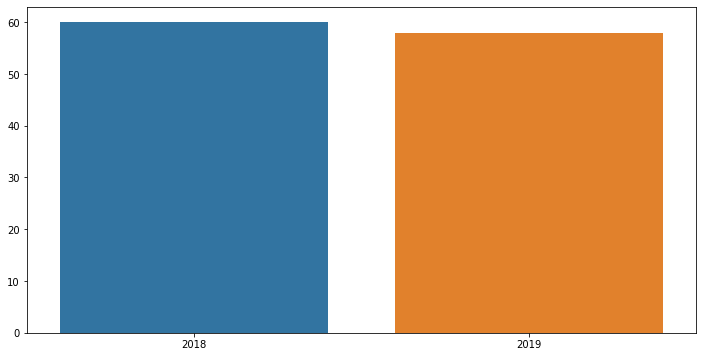

In [13]:
season = prev_match['season'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(season.index, season.values)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


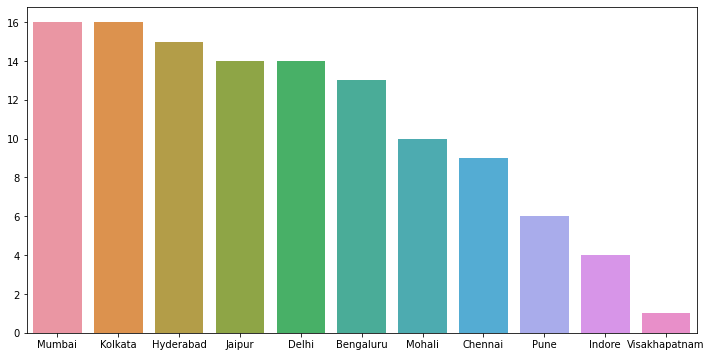

In [14]:
city = prev_match['city'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(city.index, city.values)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


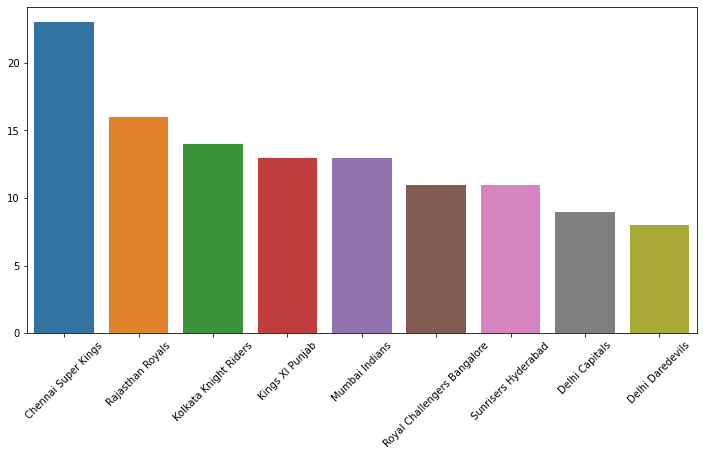

In [15]:
toss = prev_match['toss_winner'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(toss.index, toss.values)
plt.xticks(rotation=45)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


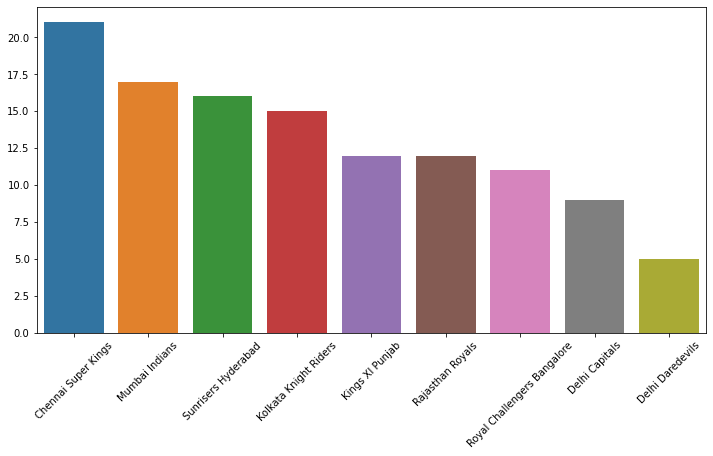

In [16]:
winner = prev_match['winner'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(winner.index, winner.values)
plt.xticks(rotation=45)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


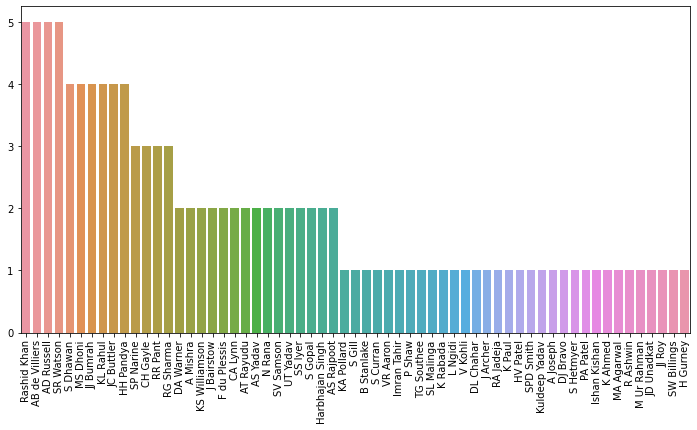

In [17]:
player = prev_match['player_of_match'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(player.index, player.values)
plt.xticks(rotation=90)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


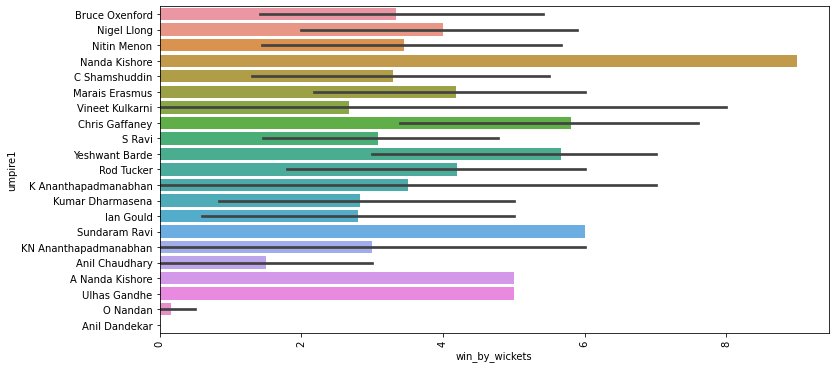

In [18]:
wicket = prev_match.sort_values('win_by_wickets', ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(wicket['win_by_wickets'], wicket['umpire1'])
plt.xticks(rotation=90)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


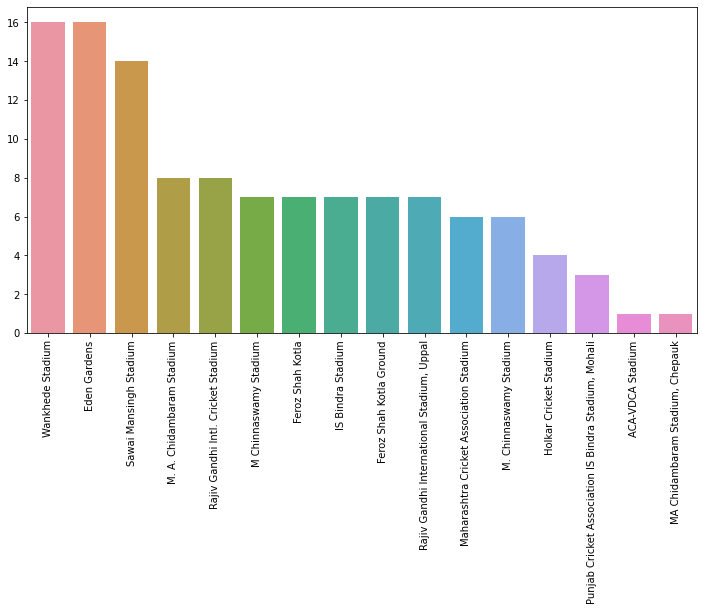

In [19]:
venue = prev_match['venue'].value_counts()
plt.figure(figsize=(12, 6))
sns.barplot(venue.index, venue.values)
plt.xticks(rotation=90)
plt.show()

In [20]:
prev_match[['city', 'toss_decision', 'result', 'win_by_runs']].sort_values('win_by_runs', ascending=False).style.background_gradient(cmap='Reds')

,city,toss_decision,result,win_by_runs
706,Hyderabad,field,normal,118
676,Kolkata,field,normal,102
745,Chennai,field,normal,80
648,Kolkata,field,normal,71
652,Pune,field,normal,64
661,Delhi,field,normal,55
739,Chennai,field,normal,46
649,Mumbai,field,normal,46
743,Hyderabad,field,normal,45
714,Hyderabad,field,normal,40


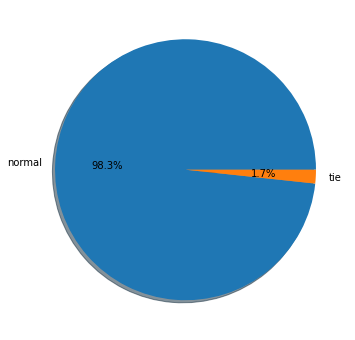

In [21]:
plt.figure(figsize=(12, 6))
res = prev_match['result'].value_counts()
plt.pie(list(res.values), labels=res.index, autopct='%1.1f%%', shadow=True);

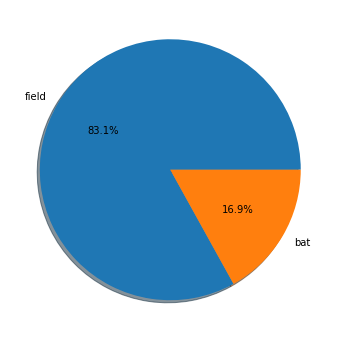

In [22]:
plt.figure(figsize=(12, 6))
toss = prev_match['toss_decision'].value_counts()
plt.pie(list(toss.values), labels=toss.index, autopct='%1.1f%%', shadow=True);


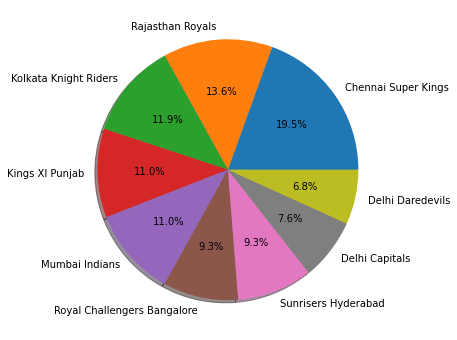

In [23]:
plt.figure(figsize=(12, 6))
toss_winner = prev_match['toss_winner'].value_counts()
plt.pie(list(toss_winner.values), labels=toss_winner.index, autopct='%1.1f%%', shadow=True);

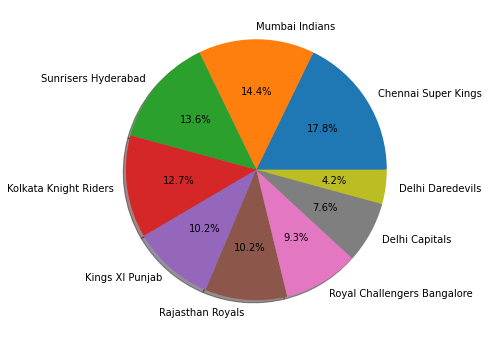

In [24]:
plt.figure(figsize=(12, 6))
win = prev_match['winner'].value_counts()
plt.pie(list(win.values), labels=win.index, autopct='%1.1f%%', shadow=True);

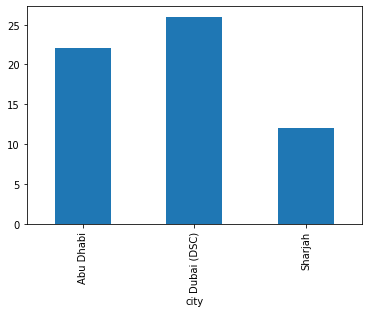

In [25]:
match2020.groupby('city')['team1'].count().plot.bar()


In [26]:
match2020.date = pd.to_datetime(match2020.date)
match2020['year'] = match2020['date'].dt.year
display(match2020[['city','team1', 'umpire1', 'year']].groupby('team1').agg('count').sort_values('year', ascending=False).head(10).style.background_gradient(cmap='Greens'))

,city,umpire1,year
team1,,,
DC,10,10,10
RCB,8,8,8
CSK,7,7,7
KKR,7,7,7
KXIP,7,7,7
MI,7,7,7
RR,7,7,7
SRH,7,7,7


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


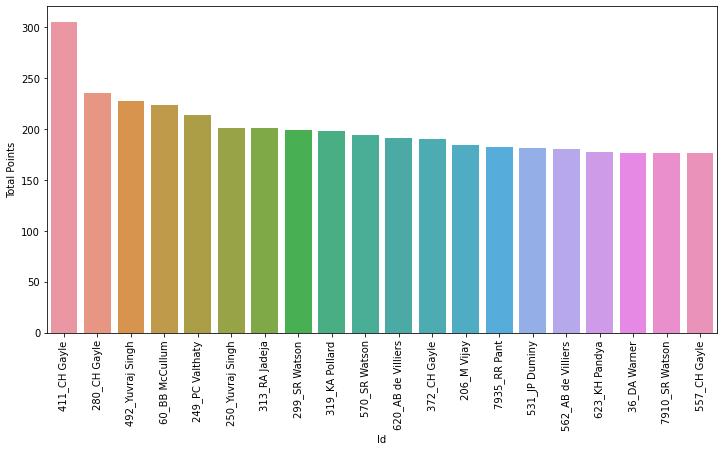

In [27]:
total_points = train.sort_values('Total Points', ascending=False).head(20)
plt.figure(figsize=(12, 6))
sns.barplot(total_points['Id'], total_points['Total Points'])
plt.xticks(rotation=90)
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


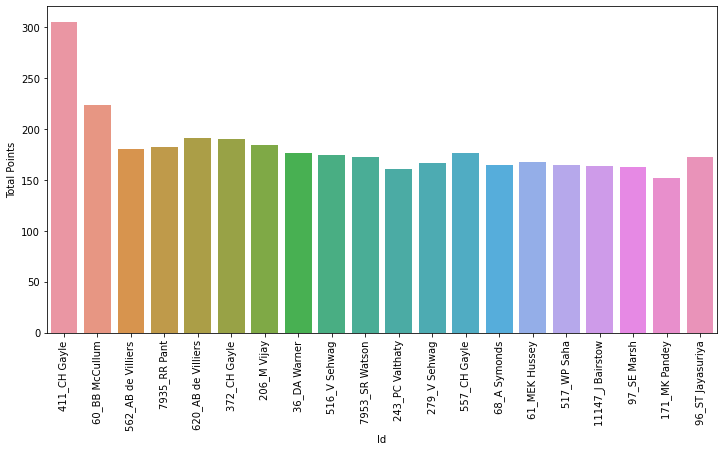

In [28]:
runs = train.sort_values('Runs', ascending=False).head(20)
plt.figure(figsize=(12, 6))
sns.barplot(runs['Id'], runs['Total Points'])
plt.xticks(rotation=90)
plt.show()

In [29]:
display(train[['Id','Boundaries', 'Wickets']].groupby('Id').agg(['min', 'max']).style.background_gradient(cmap='Blues'))

In [30]:
display(players[['Id', 'Total Points']].sort_values('Total Points', ascending=False).style.background_gradient(cmap='viridis'))

,Id,Total Points
0,1216492_AS Yadav,0
962,1216537_GJ Maxwell,0
860,1216532_K Ahmed,0
859,1216532_J Bairstow,0
858,1216532_DA Warner,0
857,1216532_Anrich Nortje,0
856,1216532_Ankit Sharma,0
855,1216532_Abhishek Sharma,0
854,1216532_Abdul Samad,0
853,1216532_AR Patel,0


In [31]:
X = train.drop(['Id', 'Total Points'], axis=1)
y = train['Total Points']

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [33]:
from sklearn.metrics import r2_score, mean_squared_error

## Decision Tree

In [34]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)
print('R2 score:',r2_score(y_test, y_pred_dt))
print('Root Mean squared error:',np.sqrt(mean_squared_error(y_test, y_pred_dt)))

R2 score: 0.9996534658854354
Root Mean squared error: 0.5592978368917215


## Random Forest

In [35]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
print('R2 score:',r2_score(y_test, y_pred_rf))
print('Root Mean squared error:',np.sqrt(mean_squared_error(y_test, y_pred_rf)))

R2 score: 0.9995625621936468
Root Mean squared error: 0.6283886028413506


## Linear Regression

In [36]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)
print('R2 score:',r2_score(y_test, y_pred_lr))
print('Root Mean squared error:',np.sqrt(mean_squared_error(y_test, y_pred_lr)))

R2 score: 1.0
Root Mean squared error: 1.4891053810082297e-13
